# Income Prediction

Assignment Task Part C: Technical Paper

- Name:       Tan Yu Hoe
- Admin No. : P2026309
- Class:      DAAA/FT/2A/04

# Getting Started


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
plt.style.use('ggplot')
import warnings

In [2]:
## Import all functions and methods

# Model_Selection
from sklearn.model_selection import (
    cross_val_score,
    GridSearchCV,
    cross_val_predict,
    cross_validate
)
# Classification Metrics
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    precision_score,
    recall_score,
    accuracy_score,
    f1_score,
    roc_auc_score,
    classification_report,
    plot_roc_curve,
    make_scorer
)
# Model Evaluation Visualisations
from yellowbrick.classifier import (
    ConfusionMatrix,
    ROCAUC
)
from yellowbrick.model_selection import (
    LearningCurve,
    FeatureImportances,
    ValidationCurve
)
from sklearn.tree import plot_tree
# Classification Models
from sklearn.dummy import DummyClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.linear_model import Perceptron
from sklearn.svm import SVC
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import RidgeClassifier
from sklearn.linear_model import RidgeClassifierCV
from sklearn.calibration import CalibratedClassifierCV
from sklearn.linear_model import SGDClassifier

In [3]:
# import the dataset
col_list = ['age', 'workclass', 'fnlwgt', 'education', 'education_num', 'marital_status', 'occupation', 'relationship', 'race', 'sex', 'capital_gain', 'capital_loss', 'hours_per_week', 'native_country', 'class']
adult = pd.read_csv('./assets/adult/adult.csv', names=col_list, na_values='?', sep=', ', engine='python')
adult.head()

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,class
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


## Exploratory Data Analysis

In [4]:
from pandas_profiling import ProfileReport
ProfileReport(adult, orange_mode=True).to_notebook_iframe()

Render HTML: 100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


In [5]:
adult.info()
# defining the numeric and categorical columns\
num_col = ['age', 'fnlwgt', 'education_num', 'capital_gain', 'capital_loss', 'hours_per_week', 'class']
cat_col = ['workclass', 'education', 'marital_status', 'occupation', 'relationship', 'race', 'sex', 'native_country']

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32561 non-null  int64 
 1   workclass       30725 non-null  object
 2   fnlwgt          32561 non-null  int64 
 3   education       32561 non-null  object
 4   education_num   32561 non-null  int64 
 5   marital_status  32561 non-null  object
 6   occupation      30718 non-null  object
 7   relationship    32561 non-null  object
 8   race            32561 non-null  object
 9   sex             32561 non-null  object
 10  capital_gain    32561 non-null  int64 
 11  capital_loss    32561 non-null  int64 
 12  hours_per_week  32561 non-null  int64 
 13  native_country  31978 non-null  object
 14  class           32561 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


In [6]:
adult.isna().sum()

age                  0
workclass         1836
fnlwgt               0
education            0
education_num        0
marital_status       0
occupation        1843
relationship         0
race                 0
sex                  0
capital_gain         0
capital_loss         0
hours_per_week       0
native_country     583
class                0
dtype: int64

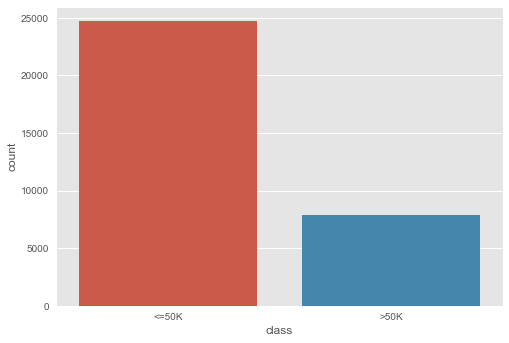

In [7]:
with plt.style.context('ggplot'):
    sns.countplot(x=adult['class'])

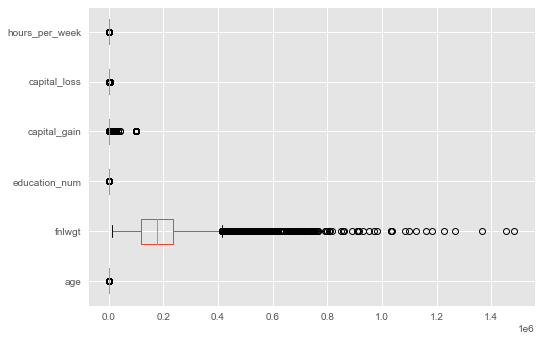

In [8]:
with plt.style.context('ggplot'):
    adult.plot.box(vert=False)

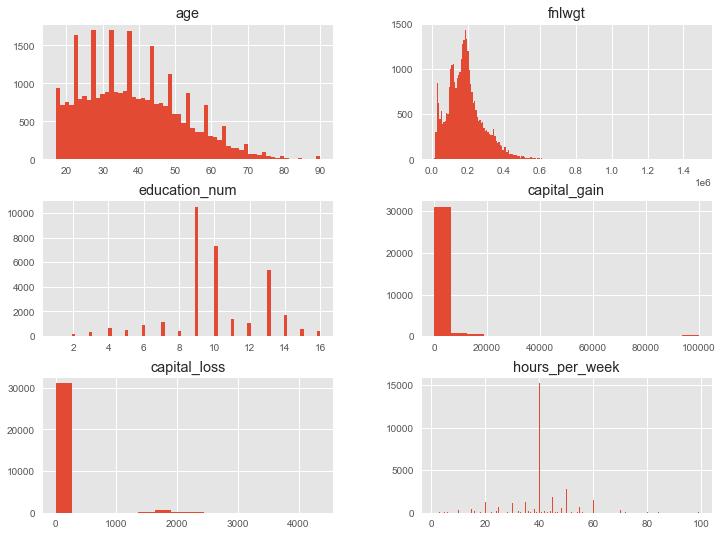

In [9]:
with plt.style.context('ggplot'):
    adult.hist(bins='auto', figsize=(12, 9)); plt.show()

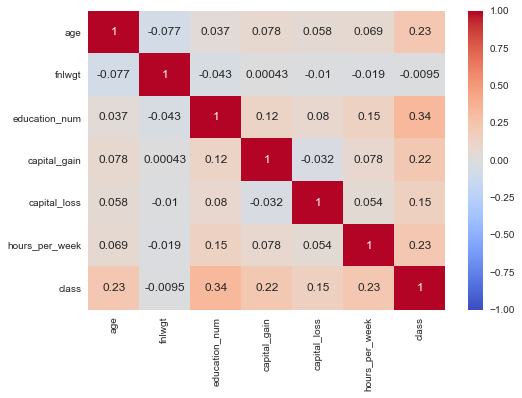

In [10]:
adult['class'] = adult['class'].replace(['<=50K'], 0).replace(['>50K'], 1)
sns.heatmap(adult.corr(), vmin=-1, vmax=1, cmap='coolwarm', annot=True); plt.show()

In [11]:
adult[cat_col].describe().T

,count,unique,top,freq
workclass,30725,8,Private,22696
education,32561,16,HS-grad,10501
marital_status,32561,7,Married-civ-spouse,14976
occupation,30718,14,Prof-specialty,4140
relationship,32561,6,Husband,13193
race,32561,5,White,27816
sex,32561,2,Male,21790
native_country,31978,41,United-States,29170


## Feature Engineering

In [12]:
# data i do not want to use
column_drop = ['education', 'occupation', 'relationship', 'race', 'native_country']
adult[column_drop]
df = adult.drop(column_drop, axis=1).dropna()
# manually encode `marital status`
df['marital_status'] = df['marital_status'].replace(['Never-married', 'Divorced', 'Separated', 'Widowed'], 0).replace(['Married-civ-spouse', 'Married-spouse-absent', 'Married-AF-spouse'], 1)
# manually encode `sex`
df['sex'] = df['sex'].replace(['Male'], 1).replace(['Female'], 0)
# encode class
df['class'] = df['class'].replace(['<=50K'], 0).replace(['>50K'], 1)
df

,age,workclass,fnlwgt,education_num,marital_status,sex,capital_gain,capital_loss,hours_per_week,class
0,39,State-gov,77516,13,0,1,2174,0,40,0
1,50,Self-emp-not-inc,83311,13,1,1,0,0,13,0
2,38,Private,215646,9,0,1,0,0,40,0
3,53,Private,234721,7,1,1,0,0,40,0
4,28,Private,338409,13,1,0,0,0,40,0
...,...,...,...,...,...,...,...,...,...,...
32556,27,Private,257302,12,1,0,0,0,38,0
32557,40,Private,154374,9,1,1,0,0,40,1
32558,58,Private,151910,9,0,0,0,0,40,0
32559,22,Private,201490,9,0,1,0,0,20,0


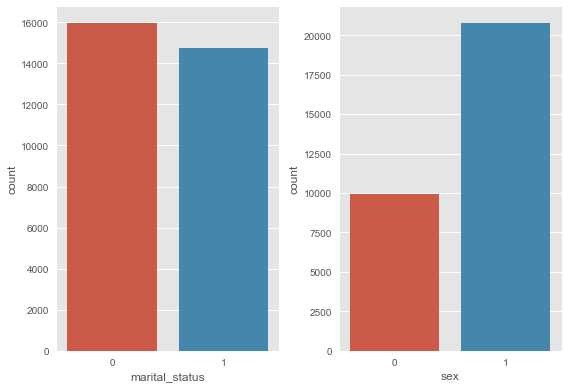

In [13]:
with plt.style.context('ggplot'):
    fig, ax = plt.subplots(1, 2, tight_layout=True)
    sns.countplot(x=df['marital_status'], ax=ax[0])
    sns.countplot(x=df['sex'], ax=ax[1])
    plt.show()

In [14]:
X = df.drop('class', axis=1)
y = df['class']

In [15]:
# train test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2)
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(24580, 9) (24580,)
(6145, 9) (6145,)


In [16]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
onehot = ColumnTransformer(
    transformers=[
        ('OneHotEncoder', OneHotEncoder(drop='first'), ['workclass'])
    ], remainder='passthrough'
)
onehot.fit(X_train, y_train)
x_col = onehot.get_feature_names()
pd.DataFrame(onehot.transform(X_train), columns=x_col)

,OneHotEncoder__x0_Local-gov,OneHotEncoder__x0_Never-worked,OneHotEncoder__x0_Private,OneHotEncoder__x0_Self-emp-inc,OneHotEncoder__x0_Self-emp-not-inc,OneHotEncoder__x0_State-gov,OneHotEncoder__x0_Without-pay,age,fnlwgt,education_num,marital_status,sex,capital_gain,capital_loss,hours_per_week
0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,55.0,23789.0,9.0,0.0,0.0,0.0,0.0,40.0
1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,45.0,339863.0,13.0,0.0,1.0,8614.0,0.0,48.0
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,26.0,137678.0,9.0,0.0,1.0,0.0,0.0,40.0
3,0.0,0.0,1.0,0.0,0.0,0.0,0.0,44.0,212894.0,15.0,0.0,1.0,0.0,0.0,55.0
4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,59.0,128105.0,9.0,1.0,1.0,0.0,0.0,35.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24575,0.0,0.0,1.0,0.0,0.0,0.0,0.0,26.0,131686.0,13.0,0.0,0.0,0.0,0.0,40.0
24576,0.0,0.0,1.0,0.0,0.0,0.0,0.0,47.0,104521.0,11.0,1.0,1.0,0.0,0.0,40.0
24577,0.0,0.0,1.0,0.0,0.0,0.0,0.0,20.0,63210.0,9.0,0.0,1.0,0.0,0.0,15.0
24578,0.0,0.0,1.0,0.0,0.0,0.0,0.0,43.0,168412.0,9.0,1.0,0.0,0.0,0.0,44.0


In [17]:
# oversampling to balance the classes on y
from imblearn.over_sampling import SMOTE
smote = SMOTE()
smote.fit(onehot.transform(X_train), y_train)

X_smote, y_smote = smote.fit_resample(onehot.transform(X_train), y_train)
pd.Series(y_smote).value_counts()

1    18427
0    18427
Name: class, dtype: int64

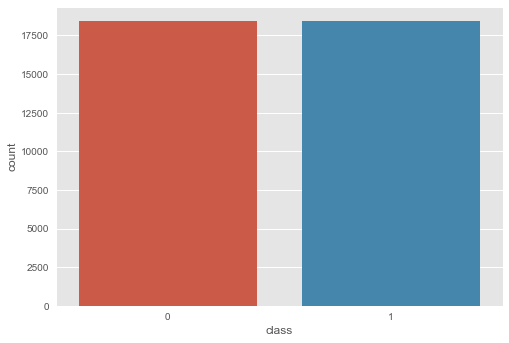

In [18]:
with plt.style.context('ggplot'):
    sns.countplot(x=y_smote)
    plt.show

In [19]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(onehot.transform(X_train), y_train)

MinMaxScaler()

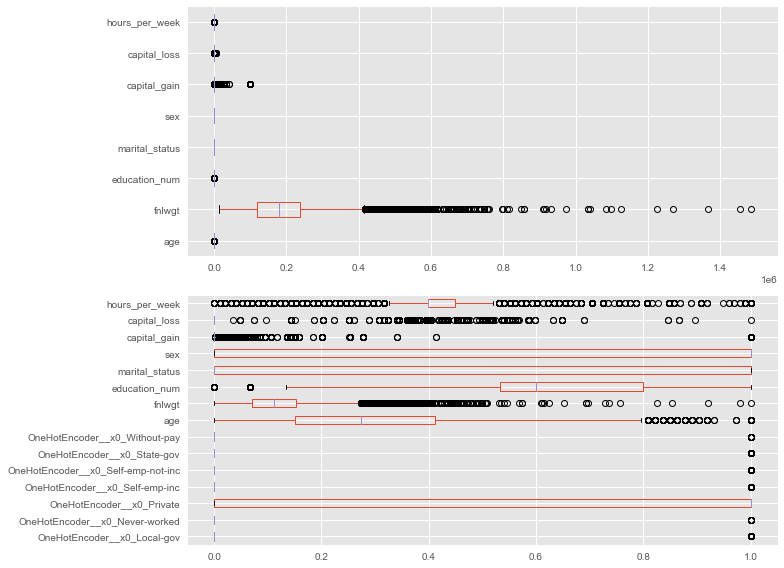

In [20]:
with plt.style.context('ggplot'):
    fig, (ax1, ax2) = plt.subplots(2, 1, tight_layout=True, figsize=(11, 8))
    X_train.plot.box(vert=False, ax=ax1)
    pd.DataFrame(scaler.transform(onehot.transform(X_train)), columns=x_col).plot.box(vert=False, ax=ax2)
    plt.show()

## Model Selection

In [21]:
# preset scoring options
scoring_methods = ['f1', 'accuracy', 'balanced_accuracy']
# Initate Classifiers with default hyperparameters
models = [
    ('DecisionTreeClassifier', DecisionTreeClassifier()),
    ('RandomForestClassifier', RandomForestClassifier()),
    ('AdaBoostClassifier', AdaBoostClassifier()),
    ('LogisticRegression', LogisticRegression()),
    ('KNeighborsClassifier', KNeighborsClassifier()),
    ('GradientBoostingClassifier', GradientBoostingClassifier()),
    ('SVC', SVC()),
    ('ExtraTreesClassifier', ExtraTreesClassifier()),
    ('GaussianNB', GaussianNB()),
    ('RidgeClassifier', RidgeClassifier()),
    ('SGDClassifier', SGDClassifier())
]

In [22]:
from imblearn.pipeline import Pipeline
def select_model(X_train, y_train, models, scoring):
    # placeholder
    out = []
    # iterate through models
    for name, model in models:
        # creating temporary pipeline
        temp_pipeline = Pipeline(
            steps = [
                ('OneHotEncoder', onehot),
                ('SMOTE', smote),
                ('scaler', scaler),
                (name, model)
            ]
        )
        # cross validate
        score = cross_validate(temp_pipeline, X_train, y_train, scoring=scoring, n_jobs=4, verbose=1, cv=5, return_train_score=False)
        # get the average score and then store in a Series
        out.append(pd.Series(score, name=name).apply(np.mean))
    return(pd.DataFrame(out).sort_values(by=['test_f1'], ascending=False))

model_scores = select_model(X_train, y_train, models, scoring_methods)

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   5 out of   5 | elapsed:    3.7s finished
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   5 out of   5 | elapsed:    7.6s finished
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   5 out of   5 | elapsed:    4.3s finished
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   5 out of   5 | elapsed:    1.4s finished
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   5 out of   5 | elapsed:    7.7s finished
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   5 out of   5 | elapsed:   11.7s finished
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   5 out of   5 | elapsed:  1

In [23]:
model_scores.style.apply(lambda x: ['background-color: yellow; color: black' if v else '' for v in x == x.max()]).apply(lambda x: ['background-color: orange; color: black' if v else '' for v in x == x.min()])

,fit_time,score_time,test_f1,test_accuracy,test_balanced_accuracy
GradientBoostingClassifier,6.640132,0.026729,0.693306,0.845443,0.796297
SVC,48.374331,10.522374,0.679123,0.824573,0.796882
AdaBoostClassifier,2.500937,0.073237,0.678615,0.836290,0.787702
LogisticRegression,0.888252,0.024335,0.669875,0.797030,0.805576
RandomForestClassifier,3.900142,0.193880,0.653052,0.832059,0.765341
SGDClassifier,0.323680,0.018155,0.651598,0.767250,0.800273
RidgeClassifier,0.479701,0.025732,0.639234,0.760903,0.789329
ExtraTreesClassifier,3.614112,0.245700,0.637974,0.822335,0.756799
KNeighborsClassifier,2.437556,2.278763,0.630266,0.811758,0.754940
DecisionTreeClassifier,0.347889,0.035895,0.596141,0.793531,0.732066


In [43]:
model_scores.to_csv('stats.csv')

In [24]:
initial_model = Pipeline(
    steps=[
        ('OneEncoder', onehot),
        ('Oversampling', smote),
        ('Normalisation', scaler),
        ('GradientBoostingClassifier', GradientBoostingClassifier())
    ]
)
initial_model.fit(X_train, y_train)
initial_model_cv = pd.DataFrame(cross_validate(initial_model, X_train, y_train, cv=10, n_jobs=4, scoring=scoring_methods, return_train_score=False))
initial_model_cv.append(pd.Series(initial_model_cv.mean(), name='Mean')).style.apply(lambda x: ['background-color: yellow; color: black' if v else '' for v in x == x.max()]).apply(lambda x: ['background-color: orange; color: black' if v else '' for v in x == x.min()])

,fit_time,score_time,test_f1,test_accuracy,test_balanced_accuracy
0,8.356078,0.018951,0.696825,0.844589,0.801023
1,8.364059,0.016955,0.693459,0.841741,0.799666
2,8.196504,0.021942,0.697976,0.848251,0.799131
3,8.276292,0.013963,0.690880,0.844182,0.794793
4,8.527800,0.022939,0.710863,0.852726,0.809700
5,8.698315,0.024944,0.680129,0.838893,0.787474
6,8.568694,0.024933,0.673650,0.835232,0.783408
7,8.785130,0.017963,0.700162,0.849471,0.800161
8,6.341208,0.012969,0.701445,0.848657,0.802319
9,6.200583,0.013963,0.708674,0.855167,0.804501


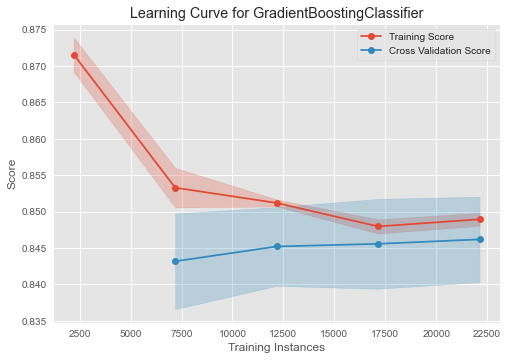

In [25]:
with plt.style.context('ggplot'):
    lc=LearningCurve(initial_model, n_jobs=4, cv=10)
    lc.fit(X_train, y_train)
    lc.show()

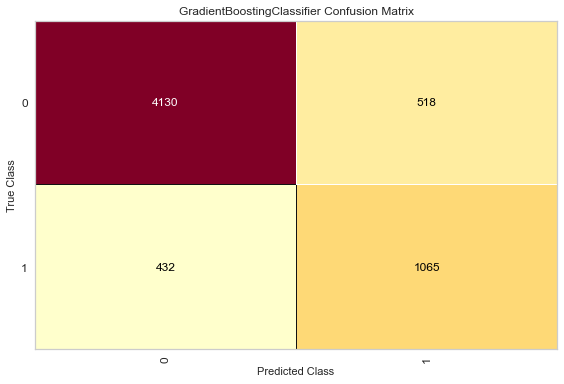

<AxesSubplot:title={'center':'GradientBoostingClassifier Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [26]:
cm=ConfusionMatrix(initial_model)
cm.fit(X_train, y_train)
cm.score(X_test, y_test)
cm.show()

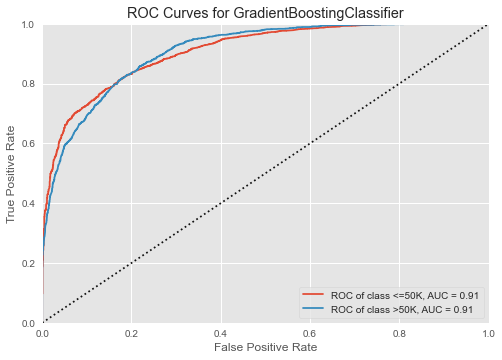

In [69]:
with plt.style.context('ggplot'):
    roc = ROCAUC(initial_model, micro=False, macro=False, binary=False, classes=['<=50K', '>50K'])
    roc.fit(X_train, y_train)
    roc.score(X_test, y_test)
    roc.show() 

In [28]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingGridSearchCV

In [29]:
grid = {
    'n_estimators': np.arange(100, 1101, 100),
    'max_depth': [3, 5, 10],
    'learning_rate': [.001, .01, .1],
    'subsample': [.5, .75, 1]
}

model_tuning = Pipeline(
    steps=[
        ('OneEncoder', onehot),
        ('Oversampling', smote),
        ('Normalisation', scaler),
        ('GridSearch', HalvingGridSearchCV(
            estimator=GradientBoostingClassifier(),
            param_grid=grid,
            factor=5,
            aggressive_elimination=True,
            cv=5,
            n_jobs=5,
            verbose=1
            )
        )
    ]
)
model_tuning.fit(X_train, y_train)

n_iterations: 4
n_required_iterations: 4
n_possible_iterations: 4
min_resources_: 294
max_resources_: 36854
aggressive_elimination: True
factor: 5
----------
iter: 0
n_candidates: 297
n_resources: 294
Fitting 5 folds for each of 297 candidates, totalling 1485 fits
----------
iter: 1
n_candidates: 60
n_resources: 1470
Fitting 5 folds for each of 60 candidates, totalling 300 fits
----------
iter: 2
n_candidates: 12
n_resources: 7350
Fitting 5 folds for each of 12 candidates, totalling 60 fits
----------
iter: 3
n_candidates: 3
n_resources: 36750
Fitting 5 folds for each of 3 candidates, totalling 15 fits


Pipeline(steps=[('OneEncoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('OneHotEncoder',
                                                  OneHotEncoder(drop='first'),
                                                  ['workclass'])])),
                ('Oversampling', SMOTE()), ('Normalisation', MinMaxScaler()),
                ('GridSearch',
                 HalvingGridSearchCV(aggressive_elimination=True,
                                     estimator=GradientBoostingClassifier(),
                                     factor=5, n_jobs=5,
                                     param_grid={'learning_rate': [0.001, 0.01,
                                                                   0.1],
                                                 'max_depth': [3, 5, 10],
                                                 'n_estimators': array([ 100,  200,  300,  400,  500,  600,  700,  800,  900, 1000, 1100]),
                  

In [30]:
print(model_tuning.named_steps['GridSearch'].best_estimator_)
print(model_tuning.named_steps['GridSearch'].best_params_)
print(model_tuning.named_steps['GridSearch'].best_score_)

GradientBoostingClassifier(learning_rate=0.01, max_depth=5, n_estimators=900,
                           subsample=0.5)
{'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 900, 'subsample': 0.5}
0.8847060241432265


In [31]:
model_tuned = Pipeline(
    steps=[
        ('OneEncoder', onehot),
        ('Oversampling', smote),
        ('Normalisation', scaler),
        ('GradientBoostingClassifier', model_tuning.named_steps['GridSearch'].best_estimator_)
    ]
)
model_tuned.fit(X_train, y_train)

Pipeline(steps=[('OneEncoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('OneHotEncoder',
                                                  OneHotEncoder(drop='first'),
                                                  ['workclass'])])),
                ('Oversampling', SMOTE()), ('Normalisation', MinMaxScaler()),
                ('GradientBoostingClassifier',
                 GradientBoostingClassifier(learning_rate=0.01, max_depth=5,
                                            n_estimators=900, subsample=0.5))])

In [32]:
tuned_model_cv = pd.DataFrame(cross_validate(model_tuned, X_train, y_train, cv=10, n_jobs=4, scoring=scoring_methods, return_train_score=False))
tuned_model_cv.append(pd.Series(tuned_model_cv.mean(), name='Mean')).style.apply(lambda x: ['background-color: yellow; color: black' if v else '' for v in x == x.max()]).apply(lambda x: ['background-color: orange; color: black' if v else '' for v in x == x.min()])

,fit_time,score_time,test_f1,test_accuracy,test_balanced_accuracy
0,45.755100,0.067870,0.708367,0.853946,0.805638
1,45.712213,0.069813,0.705694,0.850692,0.805635
2,45.597553,0.063833,0.709360,0.855980,0.804828
3,45.654401,0.063797,0.696370,0.850285,0.795612
4,46.101186,0.066809,0.712739,0.859642,0.805103
5,46.271717,0.064827,0.699507,0.851098,0.798322
6,46.136060,0.067787,0.677284,0.843369,0.781250
7,46.295632,0.065555,0.716418,0.860862,0.807761
8,39.178822,0.056815,0.709942,0.856387,0.804775
9,39.240655,0.053856,0.718121,0.863303,0.807229


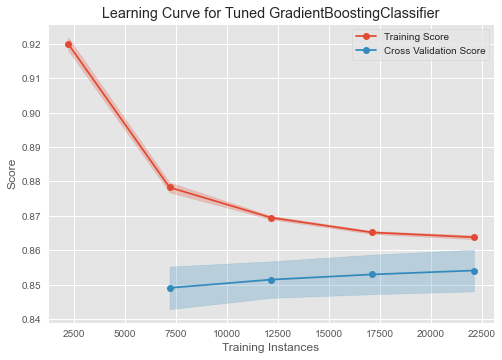

In [44]:
with plt.style.context('ggplot'):
    lc_tuned=LearningCurve(model_tuned, n_jobs=4, cv=10, title='Learning Curve for Tuned GradientBoostingClassifier')
    lc_tuned.fit(X_train, y_train)
    lc_tuned.show()

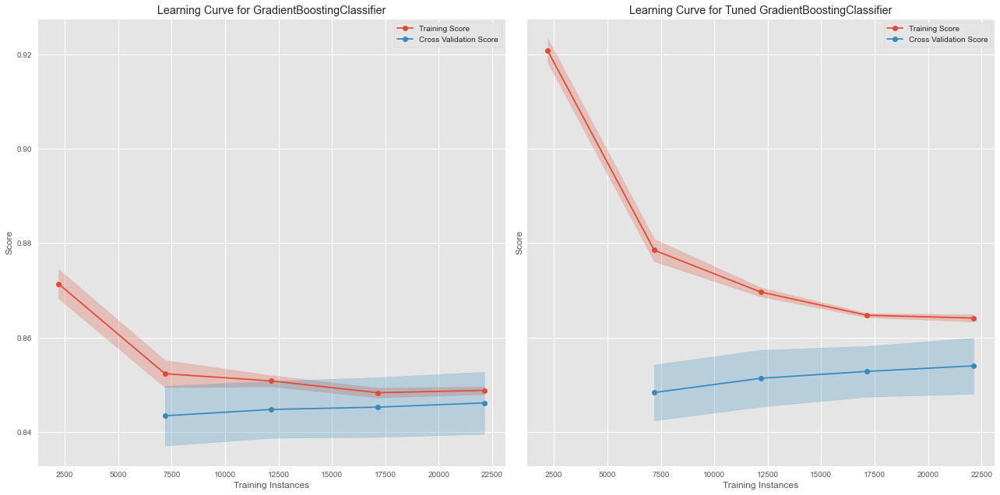

In [38]:
with plt.style.context('ggplot'):
    fig, ax = plt.subplots(1, 2, tight_layout=True, sharey=True, figsize=(18, 9))
    lc=LearningCurve(initial_model, n_jobs=4, cv=10, ax=ax[0])
    lc.fit(X_train, y_train)
    lc.finalize()
    lc_tuned=LearningCurve(model_tuned, n_jobs=4, cv=10, ax=ax[1], title='Learning Curve for Tuned GradientBoostingClassifier')
    lc_tuned.fit(X_train, y_train)
    lc_tuned.finalize()

In [71]:
pred = model_tuned.predict(X_test)
print(classification_report(y_test, pred))

              precision    recall  f1-score   support

           0       0.90      0.90      0.90      4648
           1       0.70      0.70      0.70      1497

    accuracy                           0.86      6145
   macro avg       0.80      0.80      0.80      6145
weighted avg       0.86      0.86      0.86      6145



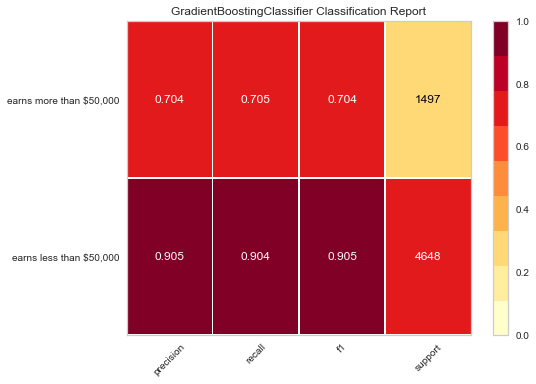

<AxesSubplot:title={'center':'GradientBoostingClassifier Classification Report'}>

In [72]:
from yellowbrick.classifier import ClassificationReport
classes = ['earns less than $50,000', 'earns more than $50,000']
class_report = ClassificationReport(model_tuned, classes=classes, support=True)
class_report.fit(X_train, y_train)
class_report.score(X_test, y_test)
class_report.show()

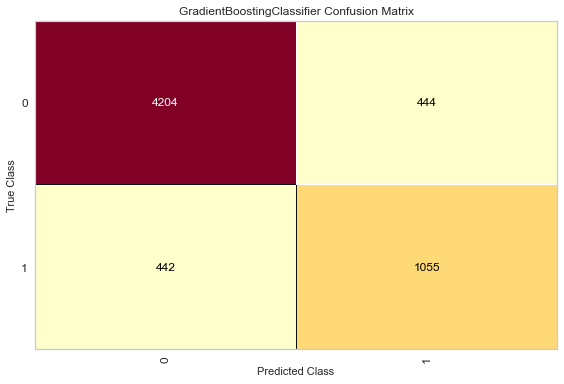

<AxesSubplot:title={'center':'GradientBoostingClassifier Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [73]:
cm = ConfusionMatrix(model_tuned)
cm.fit(X_train, y_train)
cm.score(X_test, y_test)
cm.show()

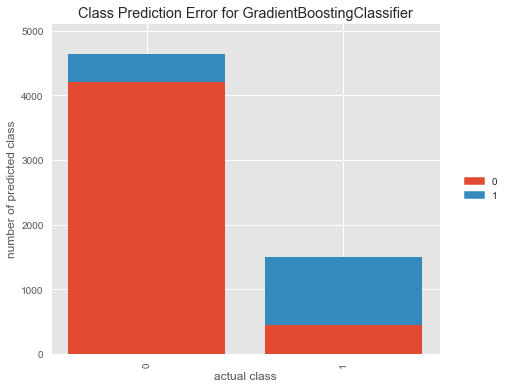

In [75]:
from yellowbrick.classifier import ClassPredictionError
with plt.style.context('ggplot'):
    classes=['earns less than $50,000', 'earns more than $50,000']
    pred_err = ClassPredictionError(model_tuned)
    pred_err.fit(X_train, y_train)
    pred_err.score(X_test, y_test)
    pred_err.show()

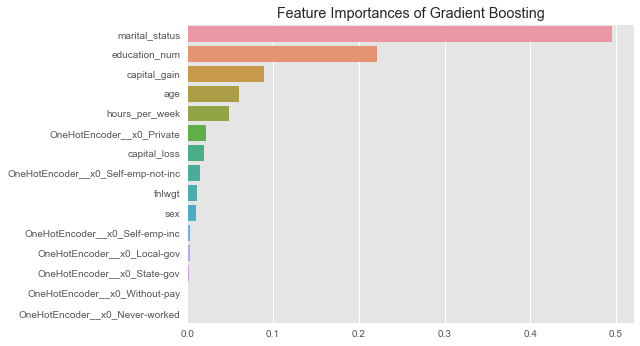

In [76]:
importance = pd.Series(model_tuned.named_steps['GradientBoostingClassifier'].feature_importances_, index=x_col).sort_values(ascending=False)
with plt.style.context('ggplot'):
    fig, ax = plt.subplots()
    sns.barplot(x=importance.values, y=importance.index, ax=ax)
    ax.set_title('Feature Importances of Gradient Boosting')
    plt.show()